In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import os
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
from tensorflow.keras import backend as K
import albumentations as A
from functools import partial
from tqdm import tqdm

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
from tensorflow.keras.callbacks import Callback

In [ ]:
seed = 42
np.random.seed(seed)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
train_img_folder_path = "/content/drive/MyDrive/archive (2)/ISIC2018_Task1-2_Training_Input"
train_label_folder_path = "/content/drive/MyDrive/archive (2)/ISIC2018_Task1_Training_GroundTruth"
val_folder_path = "/content/drive/MyDrive/archive (2)/ISIC2018_Task1-2_Validation_Input"
test_folder_path = "/content/drive/MyDrive/archive (2)/ISIC2018_Task1-2_Test_Input"


In [ ]:
# This array contains paths for the images. Folder contains a text file, we only want images I used endswith function to get jpg files
train_images_path = np.sort([os.path.join(train_img_folder_path, i) for i in os.listdir(train_img_folder_path) if i.endswith(('.jpg','.png'))])
train_labels_path = np.sort([os.path.join(train_label_folder_path, i) for i in os.listdir(train_label_folder_path) if i.endswith(('.jpg','.png'))])
test_images_path = np.sort([os.path.join(test_folder_path, i) for i in os.listdir(test_folder_path) if i.endswith(('.jpg','.png'))])

In [ ]:
train_split = 0.8
val_images_path = train_images_path[int(train_split*len(train_images_path)):]
val_labels_path = train_labels_path[int(train_split*len(train_labels_path)):]
train_images_path = train_images_path[:int(train_split*len(train_images_path))]
train_labels_path = train_labels_path[:int(train_split*len(train_labels_path))]

In [ ]:
len(train_labels_path)

2075

In [ ]:



len(val_labels_path)


519

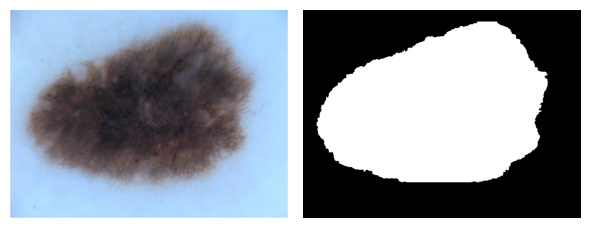

In [ ]:


img1 = Image.open(train_images_path[0])
img1_label = Image.open(train_labels_path[0])

plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plt.imshow(img1)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(img1_label, cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show();

In [ ]:
IMG_SIZE = 256
IMG_CHANNELS = 3
batch_size = 8
buffer_size = 1000
steps_per_epoch = len(train_images_path) // batch_size
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
x_train_ds = tf.data.Dataset.list_files(train_images_path, seed=seed)
y_train_ds = tf.data.Dataset.list_files(train_labels_path, seed=seed)
x_val_ds = tf.data.Dataset.list_files(val_images_path, seed=seed)
y_val_ds = tf.data.Dataset.list_files(val_labels_path, seed=seed)

In [ ]:
def parse_image(img_path, size=(256,256)):
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, size)
    return image

def parse_gt(gt_path, size=(256,256)):
    gt = tf.io.read_file(gt_path)
    gt = tf.image.decode_png(gt, channels=1)
    gt = tf.image.resize(gt, size, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    gt = tf.where(gt == 0, 0, 1)
    gt = tf.image.convert_image_dtype(gt, tf.int32)
    return gt

In [ ]:
x_train_ds = x_train_ds.map(parse_image)
y_train_ds = y_train_ds.map(parse_gt)
x_val_ds = x_val_ds.map(parse_image)
y_val_ds = y_val_ds.map(parse_gt)

In [ ]:
train_ds = tf.data.Dataset.zip((x_train_ds, y_train_ds))
val_ds = tf.data.Dataset.zip((x_val_ds, y_val_ds))

In [ ]:
def augment(image, mask, size=(256, 256)):
  transforms = A.Compose([
      A.OneOf([
          A.Transpose(),
          A.VerticalFlip(),
          A.HorizontalFlip(),
          A.RandomRotate90(),
          A.NoOp()], p=0.75),

      A.ShiftScaleRotate(p=0.1),
      A.GridDistortion(p=0.1),
      A.ElasticTransform(p=0.1),

      A.OneOf([
          A.RandomBrightnessContrast(),
          A.RandomGamma()], p=0.2)

    ], additional_targets={'mask': 'mask'})

  data = {"image":image, "mask":mask}
  aug_data = transforms(**data)

  aug_img = aug_data["image"]
  aug_img = tf.cast(aug_img, tf.float32)

  aug_mask = aug_data["mask"]
  # Making sure labels are binary (background or label)
  aug_mask = np.where(aug_mask == 0, 0, 1)
  aug_mask = tf.cast(aug_mask, tf.int32)
  return aug_img, aug_mask

In [ ]:
# I got "Tensor has no attribute .numpy() method" error. To fix this I used tf.numpy_function()
def process_data(image, mask, h=256, w=256):
  image, mask = tf.numpy_function(func=augment, inp=[image, mask], Tout=(tf.float32, tf.int32))
  # The datasets loses its shape after applying a tf.numpy_function, so this is
  # necessary for the sequential model and when inheriting from the model class.
  image.set_shape((h, w, 3))
  mask.set_shape((h, w, 1))
  return image, mask

In [ ]:
train_ds = (
    train_ds
    .cache()
    .map(partial(process_data))
    .batch(batch_size)
    .repeat()
    .prefetch(buffer_size=AUTOTUNE)
)

# Not appliyingg augmentation on validation data.
val_ds = (
    val_ds
    .cache()
    .batch(batch_size)
    .repeat()
    .prefetch(buffer_size=AUTOTUNE)
)

In [ ]:
train_ds.element_spec

(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 256, 256, 1), dtype=tf.int32, name=None))

(8, 256, 256, 3)
(8, 256, 256, 1)


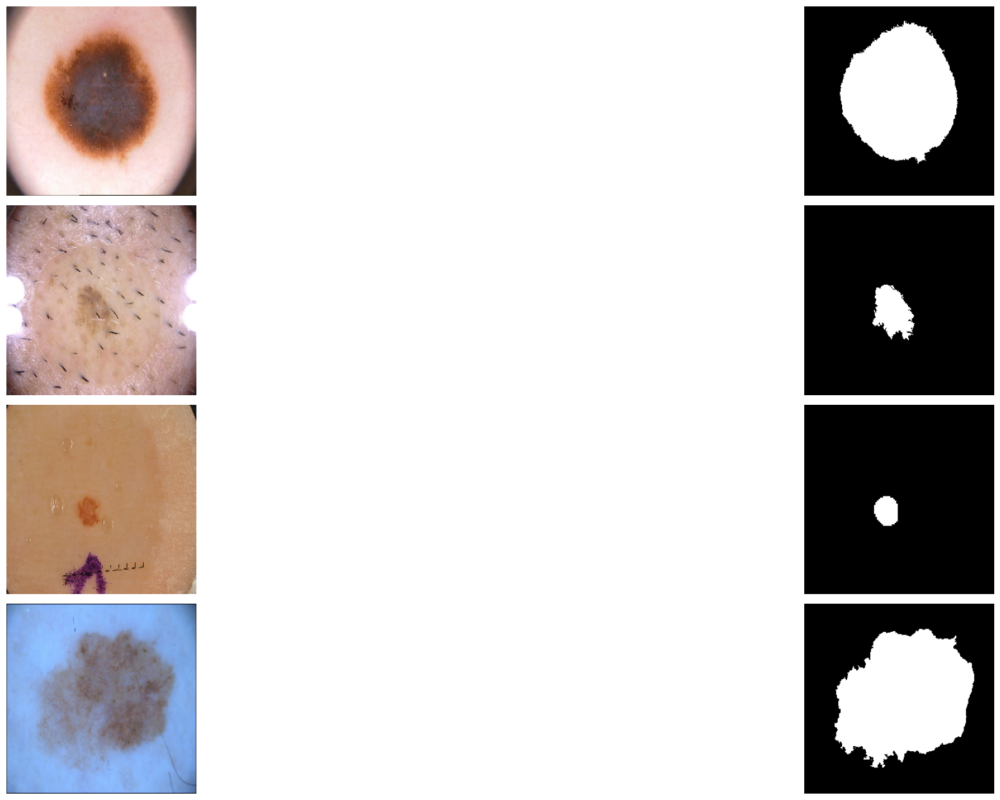

In [ ]:
for image, label in train_ds.take(1):
    print(image.shape)
    print(label.shape)
    plt.figure(figsize=(25, 25))
    for i in range(0, batch_size, 2):
        plt.subplot(batch_size, 2, i+1)
        plt.imshow(image[i])
        plt.axis('off')
        plt.subplot(batch_size, 2, i+2)
        plt.imshow(label[i], cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    break

In [ ]:
test_ds = (
    tf.data.Dataset.list_files(test_images_path)
    .map(parse_image)
    .batch(1))

MODEL ARCHITECTURE CODE

In [ ]:
# Functions to build the encoder path
def conv_block(inp, filters, padding='same', activation='relu'):
    x = Conv2D(filters, (3, 3), padding=padding, activation=activation)(inp)
    x = Conv2D(filters, (3, 3), padding=padding)(x)
    x = BatchNormalization(axis=3)(x)
    x = Activation(activation)(x)
    return x

def encoder_block(inp, filters, padding='same', pool_stride=2, activation='relu'):
    # Encoder block of a UNet passes the result from the convolution block
    # above to a max pooling layer
    x = conv_block(inp, filters, padding, activation)
    p = MaxPooling2D(pool_size=(2, 2), strides=pool_stride)(x)
    return x, p


# Function to build decoder path
def decoder_block(inp,filters,concat_layer,padding='same'):
    # Upsample the feature maps
    x = Conv2DTranspose(filters, (2,2), strides=(2,2), padding=padding)(inp)
    x = concatenate([x, concat_layer]) # Concatenation/Skip conncetion with conjuagte encoder
    x = conv_block(x, filters) # Passed into the convolution block above
    return x

# Building the first block
def build_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS=3):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    d1, p1=encoder_block(inputs, 64)
    d2, p2=encoder_block(p1, 128)
    d3, p3=encoder_block(p2, 256)
    d4, p4=encoder_block(p3, 512)
    mid = conv_block(p4, 1024) # Midsection
    e2 = decoder_block(mid, 512, d4) # Conjugate of encoder 4
    e3 = decoder_block(e2, 256, d3) # Conjugate of encoder 3
    e4 = decoder_block(e3, 128, d2) # Conjugate of encoder 2
    # o1 = Conv2D(1, (1,1), activation=None)(e4) # Output from 2nd last decoder
    e5 = decoder_block(e4, 64, d1) # Conjugate of encoder 1
    outputs = Conv2D(1, (1, 1),activation='sigmoid')(e5) #Final Output
    model = tf.keras.Model(inputs=[inputs], outputs=[outputs], name='Unet')
    return model

In [ ]:
# Metrics
def dice_coef(y_true, y_pred):
    smooth = 1e-7
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
    y_true_f = K.cast(K.flatten(y_true), 'float32')
    y_pred_f = K.cast(K.flatten(y_pred), 'float32')
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def iou(y_true, y_pred):
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
    y_true_f = K.cast(K.flatten(y_true), 'float32')
    y_pred_f = K.cast(K.flatten(y_pred), 'float32')
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum ( y_true_f + y_pred_f - y_true_f * y_pred_f)

    return intersection/union

In [ ]:
# Loss

def bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, dtype=y_pred.dtype)
    bce = K.mean(K.binary_crossentropy(y_true, y_pred), axis=-1)
    dice = dice_coef(y_true, y_pred)
    return bce - K.log(dice)

def bce_dice_loss_log(y_true, y_pred):
    y_true = K.cast(y_true, dtype=y_pred.dtype)
    bce = K.mean(K.binary_crossentropy(y_true, y_pred), axis=-1)
    dice = dice_coef(y_true, y_pred)
    return bce + 1 - dice

In [ ]:
model = build_model(IMG_SIZE, IMG_SIZE, IMG_CHANNELS)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=bce_dice_loss_log,
              metrics=[dice_coef, iou, 'accuracy'])

In [ ]:
model.summary()

Model: "Unet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 256)    │          1,024 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 64, 64, 256)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 256)    │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)    

 Total params: 31,043,521 (118.42 MB)

 Trainable params: 31,037,633 (118.40 MB)

 Non-trainable params: 5,888 (23.00 KB)

In [ ]:
steps_per_epoch = int(len(train_images_path)*0.8 // batch_size)
val_steps = int(len(train_images_path)*0.2 // batch_size)

print(f"Batch Size: {batch_size}\nSteps_per_epoch: {steps_per_epoch}\nValidation_steps: {val_steps}")

Batch Size: 8
Steps_per_epoch: 207
Validation_steps: 51


In [ ]:
callbacks = [
    EarlyStopping(monitor='val_dice_coef', patience=10, mode='max'),
    ModelCheckpoint(filepath='saved_model.keras', monitor='val_dice_coef', save_best_only=True),
    ReduceLROnPlateau(monitor='val_dice_coef', factor=0.2, patience=5, verbose=1, min_lr=5e-7)
]

In [ ]:
history = model.fit(train_ds, epochs=25, verbose=2,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=val_steps,
                    validation_data=val_ds,
                    callbacks=callbacks)

Epoch 1/25
207/207 - 581s - 3s/step - accuracy: 0.8683 - dice_coef: 0.5827 - iou: 0.4216 - loss: 0.7706 - val_accuracy: 0.4993 - val_dice_coef: 0.5017 - val_iou: 0.3413 - val_loss: 6.2801 - learning_rate: 0.0010
Epoch 2/25
207/207 - 51s - 248ms/step - accuracy: 0.8985 - dice_coef: 0.6728 - iou: 0.5141 - loss: 0.6103 - val_accuracy: 0.8692 - val_dice_coef: 0.7622 - val_iou: 0.6208 - val_loss: 0.8474 - learning_rate: 0.0010
Epoch 3/25
207/207 - 18s - 87ms/step - accuracy: 0.9107 - dice_coef: 0.7057 - iou: 0.5519 - loss: 0.5448 - val_accuracy: 0.8672 - val_dice_coef: 0.6544 - val_iou: 0.4937 - val_loss: 0.7805 - learning_rate: 0.0010
Epoch 4/25
207/207 - 18s - 87ms/step - accuracy: 0.9155 - dice_coef: 0.7292 - iou: 0.5802 - loss: 0.5106 - val_accuracy: 0.8917 - val_dice_coef: 0.7647 - val_iou: 0.6226 - val_loss: 0.5839 - learning_rate: 0.0010
Epoch 5/25
207/207 - 20s - 95ms/step - accuracy: 0.9160 - dice_coef: 0.7309 - iou: 0.5825 - loss: 0.5046 - val_accuracy: 0.7525 - val_dice_coef: 0.2

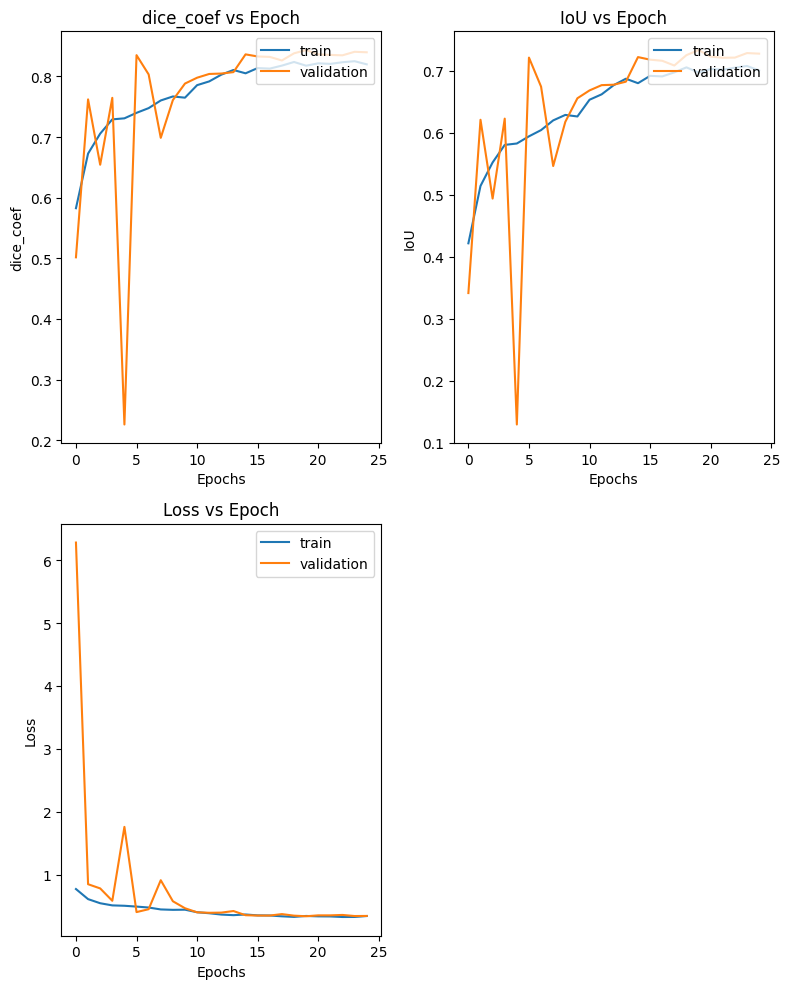

In [ ]:
plt.figure(figsize=(8, 10))

plt.subplot(2,2,1)
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('dice_coef vs Epoch')
plt.xlabel('Epochs')
plt.ylabel('dice_coef')
plt.legend(['train', 'validation'], loc='upper right')
plt.tight_layout()

plt.subplot(2,2,2)
plt.plot(history.history['iou'])
plt.plot(history.history['val_iou'])
plt.title('IoU vs Epoch')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend(['train', 'validation'], loc='upper right')
plt.tight_layout()

plt.subplot(2,2,3)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss vs Epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['train', 'validation'], loc='upper right')
plt.tight_layout()

plt.show()

In [ ]:
# This function plots 25 random images with segmantation mask.
def plot_segmentation_images(image_path, image_label_path, size=512, Random=True):
    figure = plt.subplots(figsize=(25, 25))

    # plotting rows iterating through
    for i in range(25):
        random_number = np.random.randint(len(image_path)) if Random else i
        img = Image.open(image_path[random_number])
        img_label = Image.open(image_label_path[random_number])
        img = img.resize((size, size))
        img_label = img_label.resize((size, size))
        img = np.array(img)
        img_label = np.array(img_label)
        mask = np.ma.masked_where(img_label>0, img_label)
        img_label_mask = np.ma.masked_array(img_label, mask)
        img_name = image_label_path[random_number].split('/')[-1]

        plt.subplot(5, 5, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(img, cmap='gray')
        plt.imshow(img_label_mask, cmap='jet', alpha=0.4)

    plt.show()

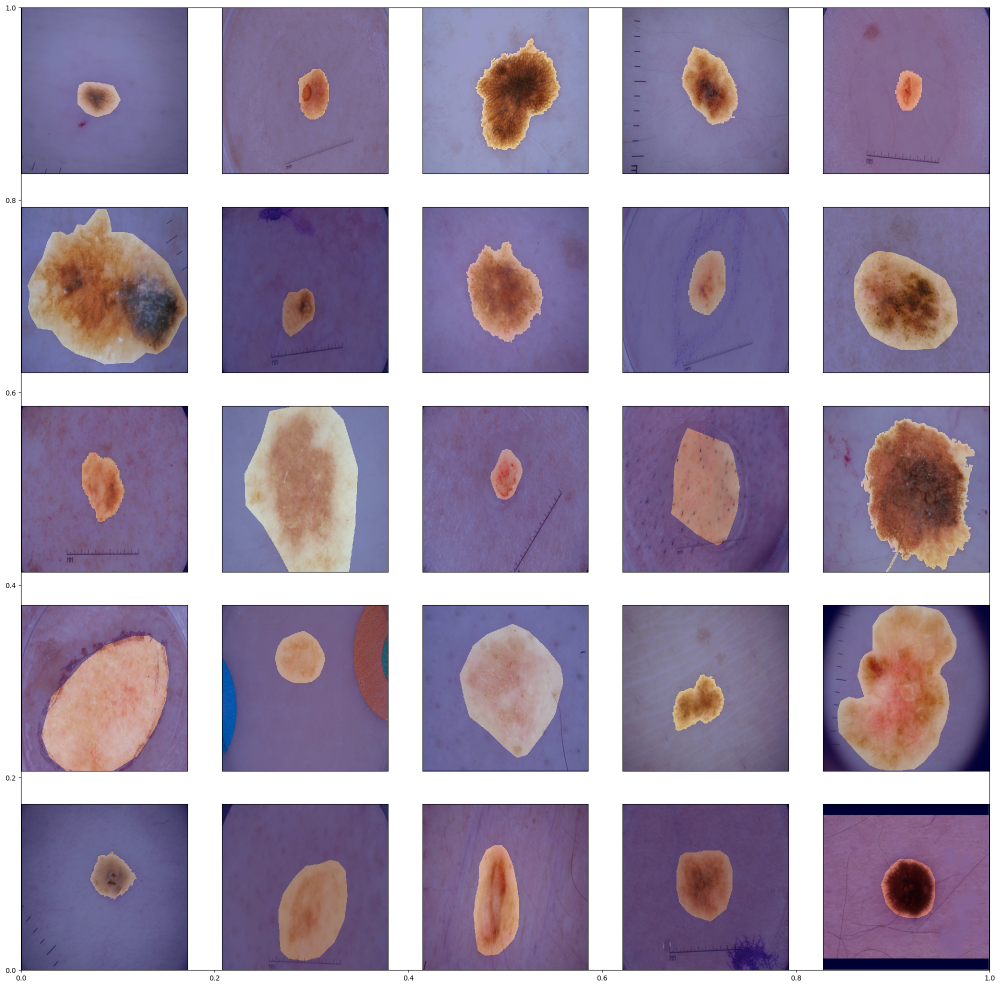

In [ ]:
# Plots 25 random train images.
plot_segmentation_images(train_images_path, train_labels_path)

In [ ]:
raw_predictions = model.predict(test_ds)

999/999 ━━━━━━━━━━━━━━━━━━━━ 51s 48ms/step


In [ ]:
predictions = np.where(raw_predictions < 0.5, 0, 1)

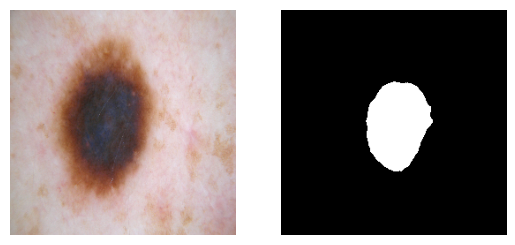

In [ ]:
image = [images[0].numpy() for images in test_ds.take(1)]
# Looking at an example before creating saving outputs as image.
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(image[0]) # Using index 0 because it is in shape of (1, 256, 256, 1)
plt.subplot(1,2,2)
plt.axis('off')
plt.imshow(predictions[0], cmap='gray')
plt.show()


In [ ]:
if not os.path.exists('predictions'):
    os.makedirs('predictions')

# loop through the predictions and save each one as an image
for i, pred in tqdm(enumerate(predictions)):
    pred = (pred * 255).astype(np.uint8)
    image = Image.fromarray(pred.squeeze())
    filename = f"prediction_{i}.png"
    image.save(os.path.join('predictions', filename))

999it [00:01, 847.46it/s]


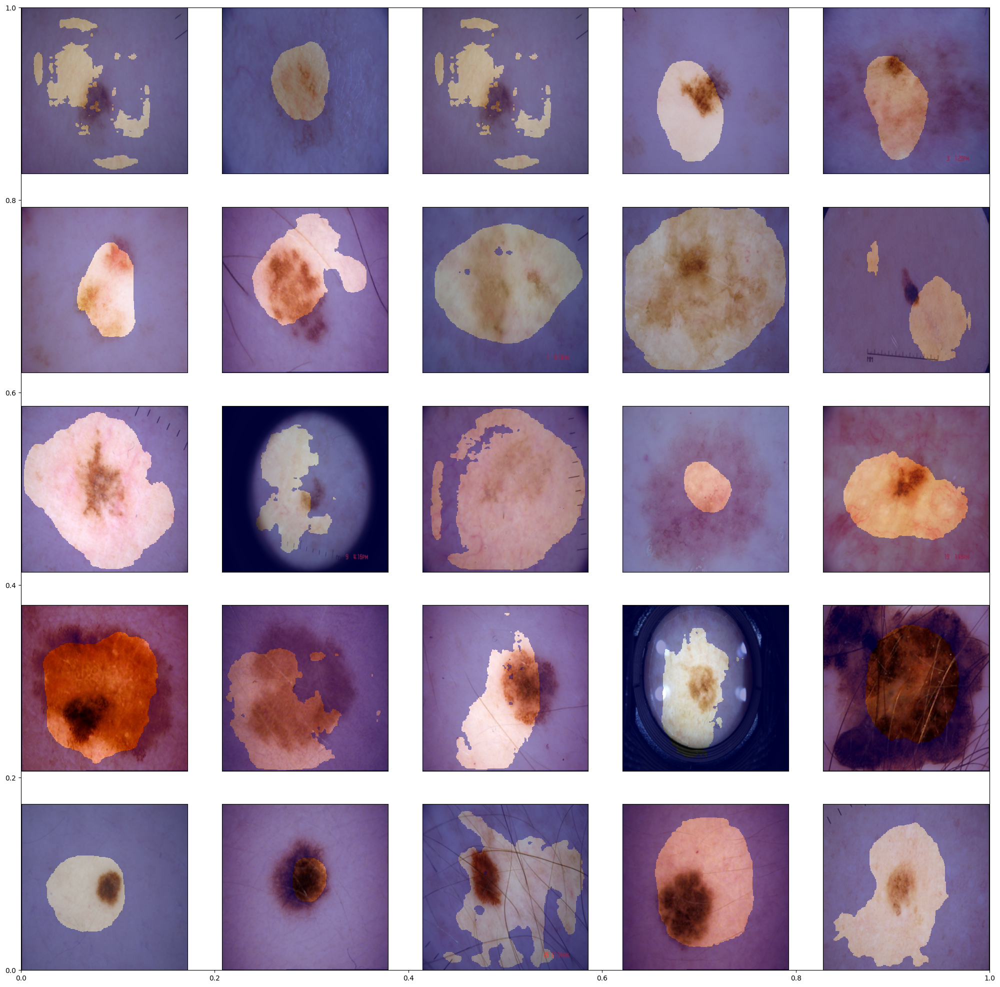

In [ ]:
pred_folder_path = os.path.join(os.getcwd(), 'predictions')
pred_images_path = np.sort([os.path.join(pred_folder_path, i) for i in os.listdir(pred_folder_path) if i.endswith('.png')])
plot_segmentation_images(test_images_path, pred_images_path, size=256, Random=True)